<a href="https://colab.research.google.com/github/hnsupriya/low-light-image-enhancement/blob/main/types_of_zero_dce.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importing required libraries

In [ ]:
import os
import random
import numpy as np
from glob import glob
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

## Dowloding LOL dataset

In [ ]:
#dataset-1
!gdown https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6
!unzip -q lol_dataset.zip
#dataset-2
#!gdown https://drive.google.com/uc?id=1GAB3uGsmAyLgtDBDONbil08vVu5wJcG3
#!unzip -q train_data.zip

Downloading...
From (original): https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6
From (redirected): https://drive.google.com/uc?id=1DdGIJ4PZPlF2ikl8mNM9V-PdVxVLbQi6&confirm=t&uuid=99d4e427-8297-4b22-b009-942a91b0b816
To: /content/lol_dataset.zip
100% 347M/347M [00:10<00:00, 33.7MB/s]


In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 16
MAX_TRAIN_IMAGES = 400


def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image, channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image


def data_generator(low_light_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset


train_low_light_images1 = sorted(glob("./lol_dataset/our485/low/*"))[:MAX_TRAIN_IMAGES]
val_low_light_images1 = sorted(glob("./lol_dataset/our485/low/*"))[MAX_TRAIN_IMAGES:]
test_low_light_images1 = sorted(glob("./lol_dataset/eval15/low/*"))


train_dataset = data_generator(train_low_light_images1)
val_dataset = data_generator(val_low_light_images1)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

print("Number of training images:", len(train_low_light_images1))
print("Number of validation images:", len(val_low_light_images1))
print("Number of test images:", len(test_low_light_images1))

Train Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <_BatchDataset element_spec=TensorSpec(shape=(16, 256, 256, 3), dtype=tf.float32, name=None)>
Number of training images: 400
Number of validation images: 85
Number of test images: 15


## Color Constancy Loss

In [ ]:

def color_constancy_loss(x):
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mr, mg, mb = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]
    d_rg = tf.square(mr - mg)
    d_rb = tf.square(mr - mb)
    d_gb = tf.square(mb - mg)
    return tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))


### Exposure loss


In [ ]:

def exposure_loss(x, mean_val=0.6):
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))


### Illumination smoothness loss

To preserve the monotonicity relations between neighboring pixels, the
*illumination smoothness loss* is added to each curve parameter map.

In [ ]:

def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    h_x = tf.shape(x)[1]
    w_x = tf.shape(x)[2]
    count_h = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_w = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    h_tv = tf.reduce_sum(tf.square((x[:, 1:, :, :] - x[:, : h_x - 1, :, :])))
    w_tv = tf.reduce_sum(tf.square((x[:, :, 1:, :] - x[:, :, : w_x - 1, :])))
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_h = tf.cast(count_h, dtype=tf.float32)
    count_w = tf.cast(count_w, dtype=tf.float32)
    return 2 * (h_tv / count_h + w_tv / count_w) / batch_size


### Spatial consistency loss

The *spatial consistency loss* encourages spatial coherence of the enhanced image by
preserving the contrast between neighboring regions across the input image and its enhanced version.

In [ ]:

class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(reduction="none")

        self.left_kernel = tf.constant(
            [[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.right_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.up_kernel = tf.constant(
            [[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.down_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32
        )

    def call(self, y_true, y_pred):

        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(
            original_mean, ksize=4, strides=4, padding="VALID"
        )
        enhanced_pool = tf.nn.avg_pool2d(
            enhanced_mean, ksize=4, strides=4, padding="VALID"
        )

        d_original_left = tf.nn.conv2d(
            original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_right = tf.nn.conv2d(
            original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_up = tf.nn.conv2d(
            original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_down = tf.nn.conv2d(
            original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       896       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 32)       9248      ['conv2d[0][0]']              
                                                                                                  
 conv2d_2 (Conv2D)           (None, None, None, 32)       9248      ['conv2d_1[0][0]']            
                                                                                              

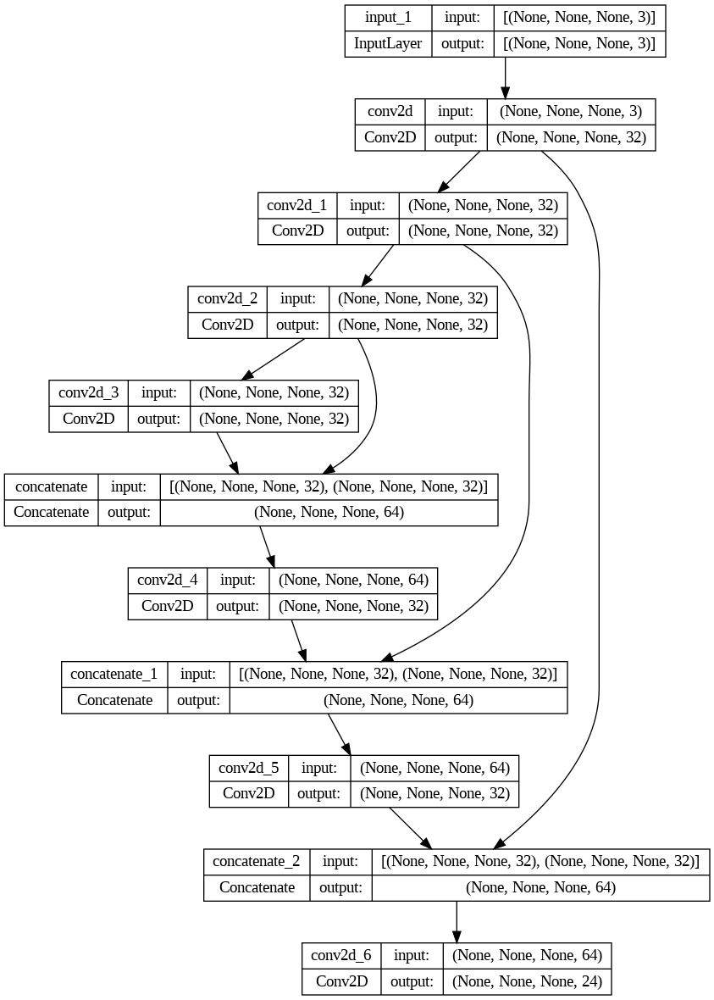

In [ ]:
# @title Bulding Zero-DCE Framework and Deep Curve Estimation

def build_dce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_img)
    conv2 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_img, outputs=x_r)


class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.dce_model = build_dce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the DCE-Net"""
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )

zero_dce_model = build_dce_net()
zero_dce_model.summary()
tf.keras.utils.plot_model(zero_dce_model, show_shapes=True)


zero-dce training


Epoch 1/100
25/25 [==============================] - 21s 364ms/step - total_loss: 4.9815 - illumination_smoothness_loss: 2.0307 - spatial_constancy_loss: 1.1609e-05 - color_constancy_loss: 0.0031 - exposure_loss: 2.9477 - val_total_loss: 4.4157 - val_illumination_smoothness_loss: 1.4042 - val_spatial_constancy_loss: 2.2874e-06 - val_color_constancy_loss: 4.5823e-04 - val_exposure_loss: 3.0110
Epoch 2/100
25/25 [==============================] - 7s 269ms/step - total_loss: 4.2073 - illumination_smoothness_loss: 1.2782 - spatial_constancy_loss: 8.1617e-06 - color_constancy_loss: 0.0030 - exposure_loss: 2.9261 - val_total_loss: 3.8891 - val_illumination_smoothness_loss: 0.8924 - val_spatial_constancy_loss: 1.5209e-05 - val_color_constancy_loss: 4.0690e-04 - val_exposure_loss: 2.9963
Epoch 3/100
25/25 [==============================] - 7s 272ms/step - total_loss: 3.7849 - illumination_smoothness_loss: 0.8701 - spatial_constancy_loss: 2.8808e-05 - color_constancy_loss: 0.0029 - exposure_los

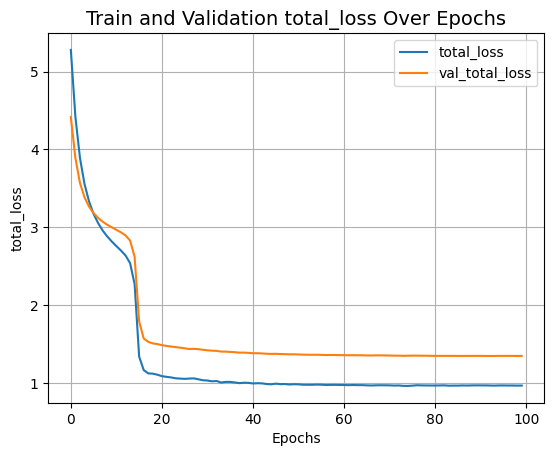

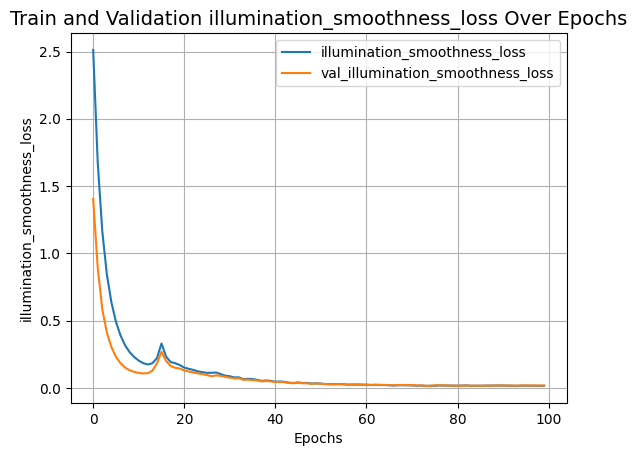

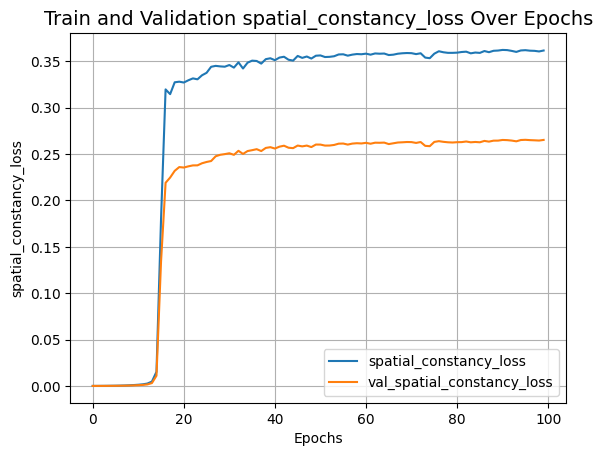

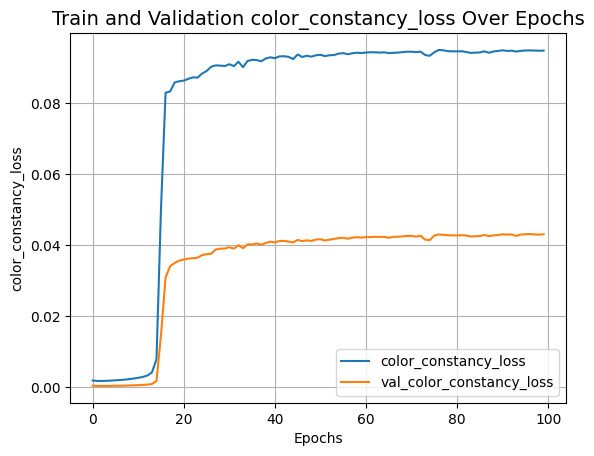

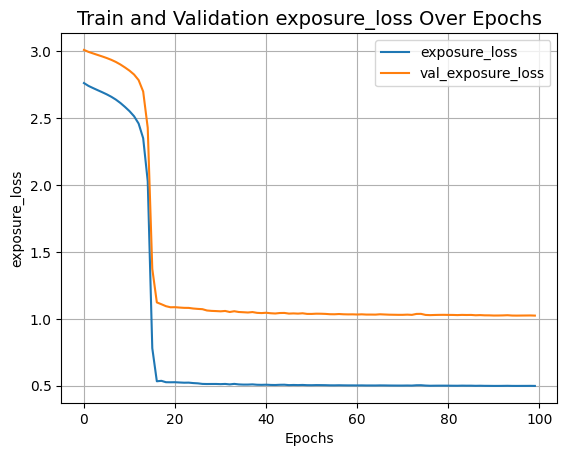

In [ ]:

zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
history = zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=100)


def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

## Bulding seperable Zero-DCE Framework and Deep Curve Estimation



In [ ]:
def build_sdce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_img)
    conv2 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.SeparableConv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.SeparableConv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_img, outputs=x_r)

class ZeroDCEPlusPlus(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.dce_model = build_sdce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the DCE-Net"""
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )


In [ ]:
# @title Printing parameters and block diagram of network
zero_dceplusplus_model = build_sdce_net()
zero_dceplusplus_model.summary()
tf.keras.utils.plot_model(zero_dceplusplus_model, show_shapes=True)

Epoch 1/100
25/25 [==============================] - 18s 361ms/step - total_loss: 2.9556 - illumination_smoothness_loss: 0.0181 - spatial_constancy_loss: 3.6013e-06 - color_constancy_loss: 0.0026 - exposure_loss: 2.9348 - val_total_loss: 3.0236 - val_illumination_smoothness_loss: 0.0171 - val_spatial_constancy_loss: 6.0302e-06 - val_color_constancy_loss: 3.8408e-04 - val_exposure_loss: 3.0061
Epoch 2/100
25/25 [==============================] - 8s 311ms/step - total_loss: 2.9400 - illumination_smoothness_loss: 0.0141 - spatial_constancy_loss: 1.3176e-05 - color_constancy_loss: 0.0027 - exposure_loss: 2.9232 - val_total_loss: 3.0101 - val_illumination_smoothness_loss: 0.0140 - val_spatial_constancy_loss: 1.7623e-05 - val_color_constancy_loss: 3.9718e-04 - val_exposure_loss: 2.9956
Epoch 3/100
25/25 [==============================] - 8s 320ms/step - total_loss: 2.9253 - illumination_smoothness_loss: 0.0117 - spatial_constancy_loss: 3.0790e-05 - color_constancy_loss: 0.0028 - exposure_los

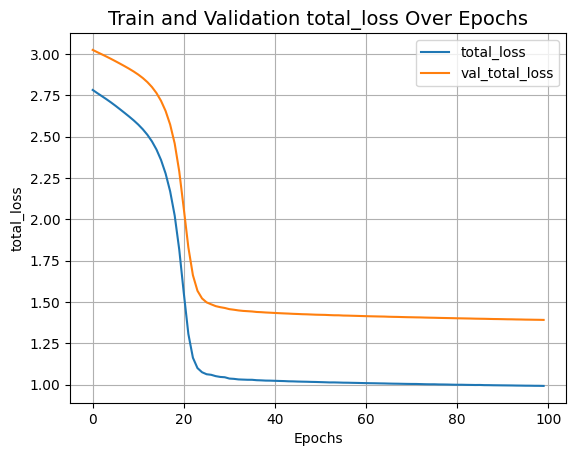

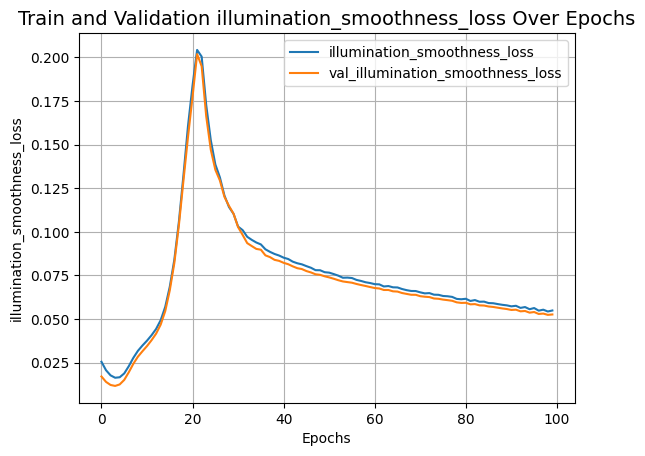

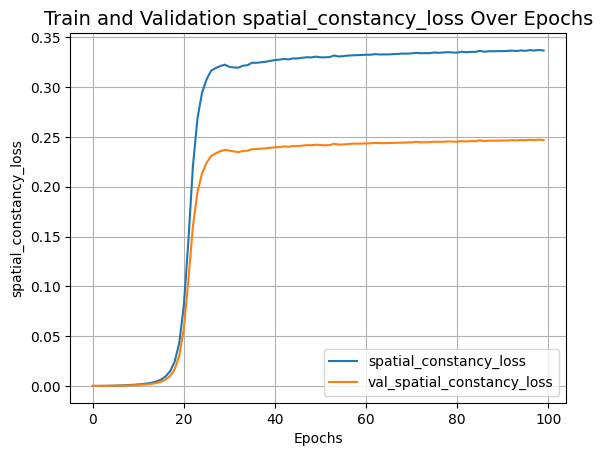

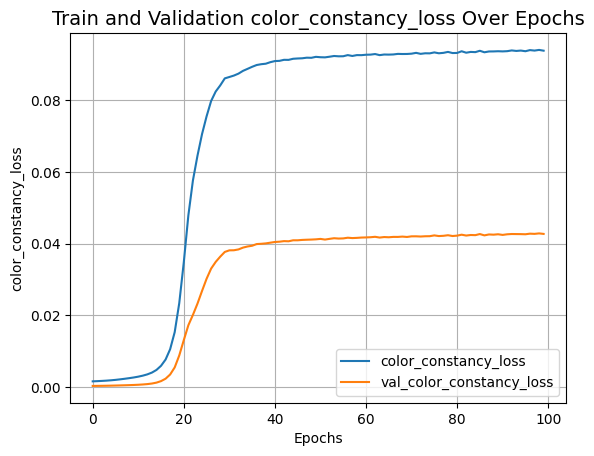

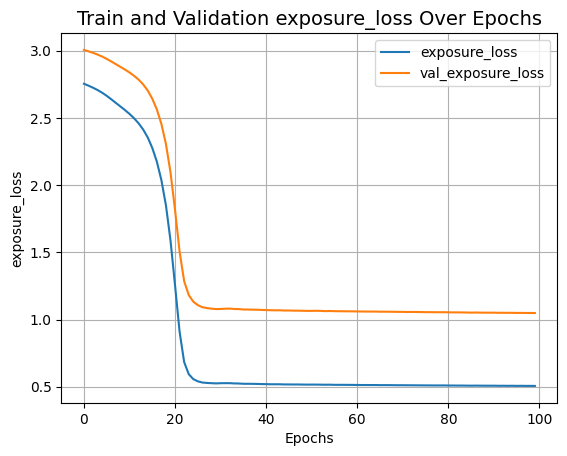

In [ ]:
# @title seperable zero dce Training
zero_dceplusplus_model = ZeroDCEPlusPlus()
zero_dceplusplus_model.compile(learning_rate=1e-4)
history = zero_dceplusplus_model.fit(train_dataset, validation_data=val_dataset, epochs=100)
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

# Plot the training history
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")


#Bulding grouped Zero-DCE Framework and Deep Curve Estimation

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_5 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 tf.split (TFOpLambda)       [(None, None, None, 1),      0         ['input_5[0][0]']             
                              (None, None, None, 1),                                              
                              (None, None, None, 1)]                                              
                                                                                                  
 conv2d_21 (Conv2D)          (None, None, None, 10)       20        ['tf.split[0][0]']            
                                                                                            

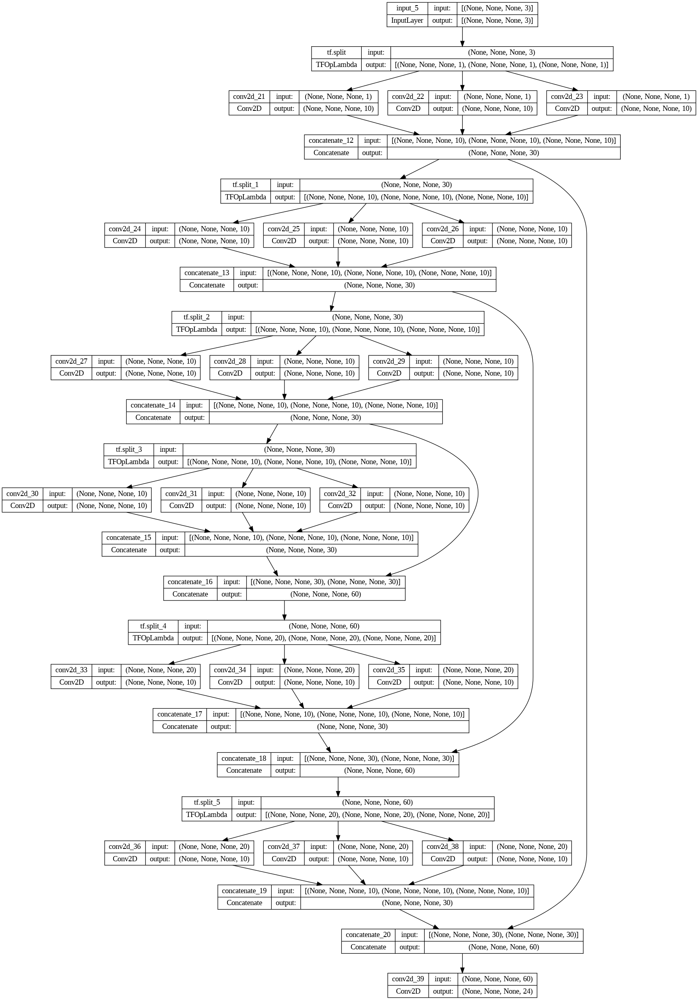

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

def grouped_convolution(x, filters, kernel_size, groups, strides=(1, 1), padding='same', activation='relu'):
    # Split input and apply Conv2D separately to each group
    input_groups = tf.split(x, groups, axis=-1)
    output_groups = [layers.Conv2D(filters // groups, kernel_size, strides=strides, padding=padding, activation=activation)(group) for group in input_groups]
    # Concatenate the results
    x = layers.concatenate(output_groups, axis=-1)
    return x

def build_gdce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = grouped_convolution(input_img, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv2 = grouped_convolution(conv1, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv3 = grouped_convolution(conv2, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv4 = grouped_convolution(conv3, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])

    conv5 = grouped_convolution(int_con1, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])

    conv6 = grouped_convolution(int_con2, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])

    x_r = layers.Conv2D(24, (3, 3), activation="tanh", padding="same")(int_con3)

    return keras.Model(inputs=input_img, outputs=x_r)

class GroupedZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.gdce_model = build_gdce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        r3 = output[:, :, :, 6:9]
        r4 = output[:, :, :, 9:12]
        r5 = output[:, :, :, 12:15]
        r6 = output[:, :, :, 15:18]
        r7 = output[:, :, :, 18:21]
        r8 = output[:, :, :, 21:24]
        x = data + r1 * (tf.square(data) - data)
        x = x + r2 * (tf.square(x) - x)
        x = x + r3 * (tf.square(x) - x)
        enhanced_image = x + r4 * (tf.square(x) - x)
        x = enhanced_image + r5 * (tf.square(enhanced_image) - enhanced_image)
        x = x + r6 * (tf.square(x) - x)
        x = x + r7 * (tf.square(x) - x)
        enhanced_image = x + r8 * (tf.square(x) - x)
        return enhanced_image

    def call(self, data):
        gdce_net_output = self.gdce_model(data)
        return self.get_enhanced_image(data, gdce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.gdce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.gdce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.gdce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.gdce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the DCE-Net"""
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the DCE-Net"""
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )
# @title
groupedZeroDCE_model = build_gdce_net()
groupedZeroDCE_model.summary()
tf.keras.utils.plot_model(groupedZeroDCE_model, show_shapes=True)


Epoch 1/100
25/25 [==============================] - 17s 269ms/step - total_loss: 6.8573 - illumination_smoothness_loss: 3.9142 - spatial_constancy_loss: 1.8483e-06 - color_constancy_loss: 0.0028 - exposure_loss: 2.9404 - val_total_loss: 5.8820 - val_illumination_smoothness_loss: 2.8718 - val_spatial_constancy_loss: 2.3201e-06 - val_color_constancy_loss: 4.5714e-04 - val_exposure_loss: 3.0097
Epoch 2/100
25/25 [==============================] - 6s 239ms/step - total_loss: 5.6627 - illumination_smoothness_loss: 2.7341 - spatial_constancy_loss: 8.0917e-06 - color_constancy_loss: 0.0028 - exposure_loss: 2.9259 - val_total_loss: 4.9464 - val_illumination_smoothness_loss: 1.9481 - val_spatial_constancy_loss: 1.2358e-05 - val_color_constancy_loss: 4.4601e-04 - val_exposure_loss: 2.9979
Epoch 3/100
25/25 [==============================] - 7s 265ms/step - total_loss: 4.9290 - illumination_smoothness_loss: 2.0128 - spatial_constancy_loss: 2.3096e-05 - color_constancy_loss: 0.0028 - exposure_los

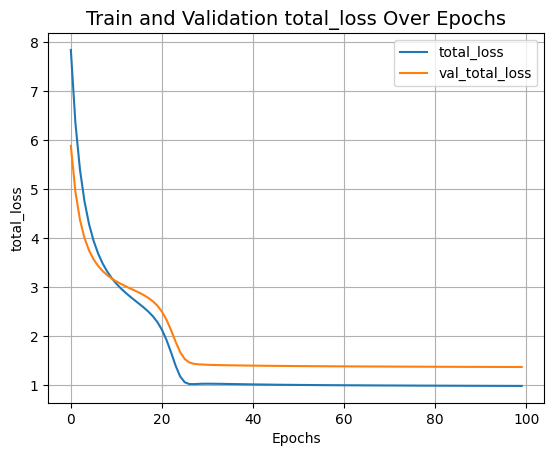

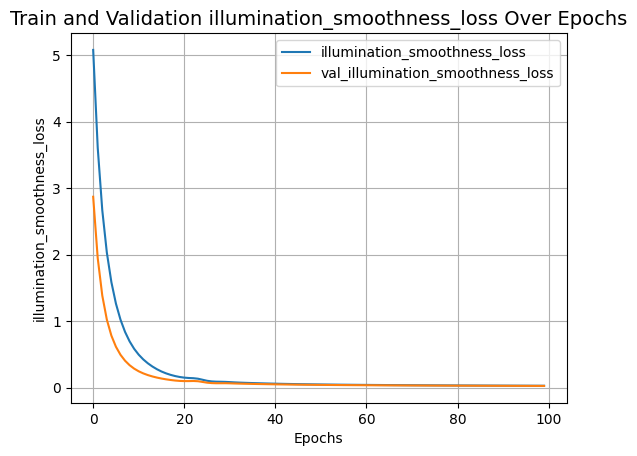

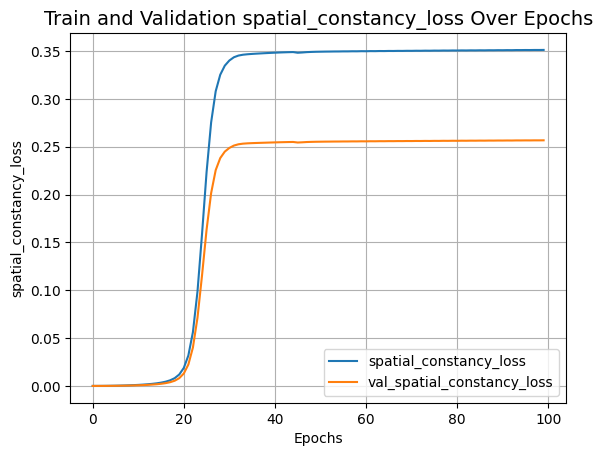

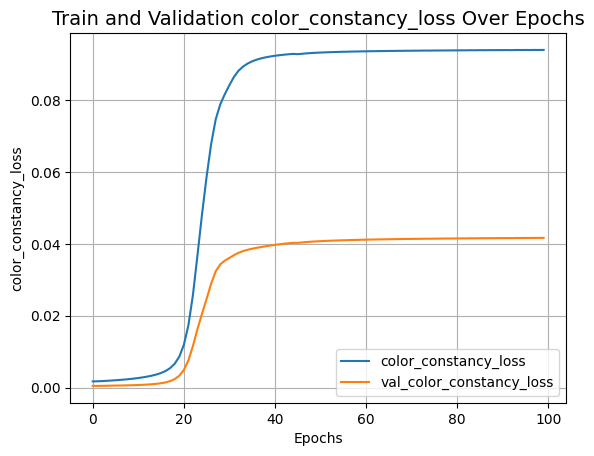

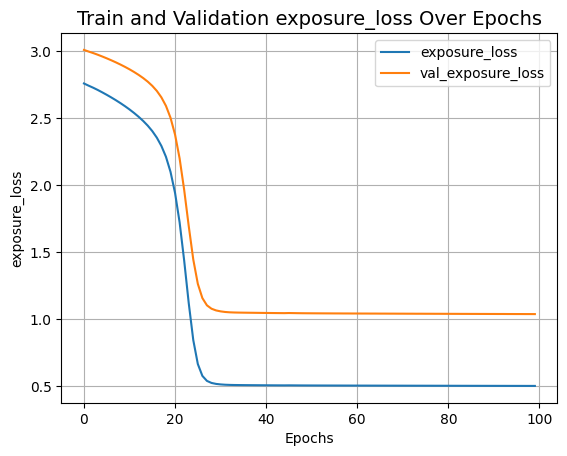

In [ ]:
# @title grouped zero dce Training
groupedZeroDCE_model = GroupedZeroDCE()
groupedZeroDCE_model.compile(learning_rate=1e-4)
history = groupedZeroDCE_model.fit(train_dataset, validation_data=val_dataset, epochs=100)
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

# Plot the training history
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")


Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d_59 (Conv2D)          (None, None, None, 32)       896       ['input_7[0][0]']             
                                                                                                  
 conv2d_60 (Conv2D)          (None, None, None, 32)       9248      ['conv2d_59[0][0]']           
                                                                                                  
 conv2d_61 (Conv2D)          (None, None, None, 32)       9248      ['conv2d_60[0][0]']           
                                                                                            

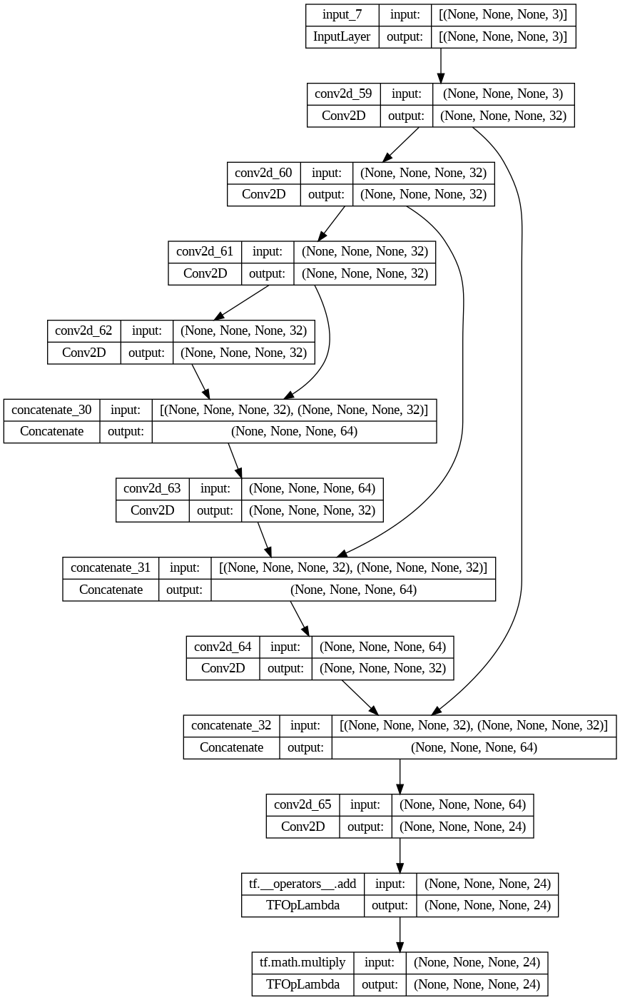

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

def build_azdce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(input_img)
    conv2 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv1)
    conv3 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv2)
    conv4 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(int_con3)
    x_r = (x_r + 2) * 1.5  # Scaling the output between 1 and 3 as per the AZDCE paper
    return keras.Model(inputs=input_img, outputs=x_r)

class AZDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.azdce_model = build_azdce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        y1 = r1 * (data**3 - 3 * data**2 + (4 - r1) * data)
        y2 = r2 * (y1**3 - 3 * y1**2 + (4 - r2) * y1)
        enhanced_image = y2
        return enhanced_image

    def call(self, data):
        azdce_net_output = self.azdce_model(data)
        return self.get_enhanced_image(data, azdce_net_output)

    # Compute losses (same as Zero-DCE)
    # ...
    def compute_losses(self, data, output):
      enhanced_image = self.get_enhanced_image(data, output)
      loss_illumination = 200 * illumination_smoothness_loss(output)
      loss_spatial_constancy = tf.reduce_mean(
          self.spatial_constancy_loss(enhanced_image, data)
      )
      loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
      loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
      total_loss = (
          loss_illumination
          + loss_spatial_constancy
          + loss_color_constancy
          + loss_exposure
      )
      return {
          "total_loss": total_loss,
          "illumination_smoothness_loss": loss_illumination,
          "spatial_constancy_loss": loss_spatial_constancy,
          "color_constancy_loss": loss_color_constancy,
          "exposure_loss": loss_exposure,
      }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.azdce_model(data)
            losses = self.compute_losses(data, output)
            gradients = tape.gradient(losses["total_loss"], self.azdce_model.trainable_weights)
            self.optimizer.apply_gradients(zip(gradients, self.azdce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.azdce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the AZDCE-Net"""
        self.azdce_model.save_weights(filepath, overwrite=overwrite, save_format=save_format, options=options)

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the AZDCE-Net"""
        self.azdce_model.load_weights(filepath=filepath, by_name=by_name, skip_mismatch=skip_mismatch, options=options)

# Training and evaluation (same as Zero-DCE)
# ...
# @title Printing parameters and block diagram of network
attention_zero_dce_model = build_azdce_net()
attention_zero_dce_model.summary()
tf.keras.utils.plot_model(attention_zero_dce_model, show_shapes=True)

Epoch 1/100
25/25 [==============================] - 11s 282ms/step - total_loss: 13.3218 - illumination_smoothness_loss: 7.6252 - spatial_constancy_loss: 0.7230 - color_constancy_loss: 0.8276 - exposure_loss: 4.1460 - val_total_loss: 14.9828 - val_illumination_smoothness_loss: 6.4007 - val_spatial_constancy_loss: 1.3119 - val_color_constancy_loss: 0.1455 - val_exposure_loss: 7.1247
Epoch 2/100
25/25 [==============================] - 7s 285ms/step - total_loss: 7.9048 - illumination_smoothness_loss: 5.7360 - spatial_constancy_loss: 0.0971 - color_constancy_loss: 0.0337 - exposure_loss: 2.0380 - val_total_loss: 8.6937 - val_illumination_smoothness_loss: 4.8466 - val_spatial_constancy_loss: 0.4675 - val_color_constancy_loss: 0.0186 - val_exposure_loss: 3.3610
Epoch 3/100
25/25 [==============================] - 7s 278ms/step - total_loss: 6.5802 - illumination_smoothness_loss: 4.5106 - spatial_constancy_loss: 0.0819 - color_constancy_loss: 0.0240 - exposure_loss: 1.9637 - val_total_loss

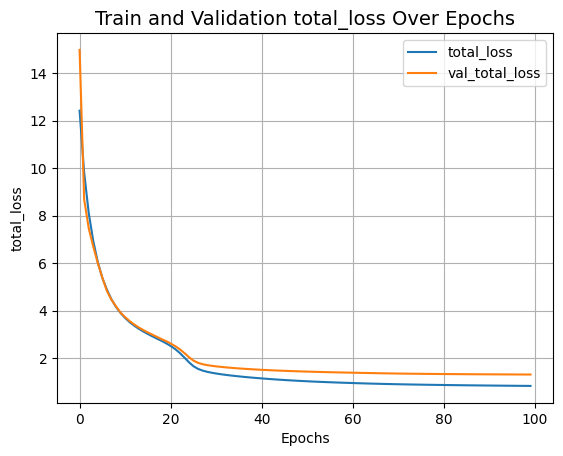

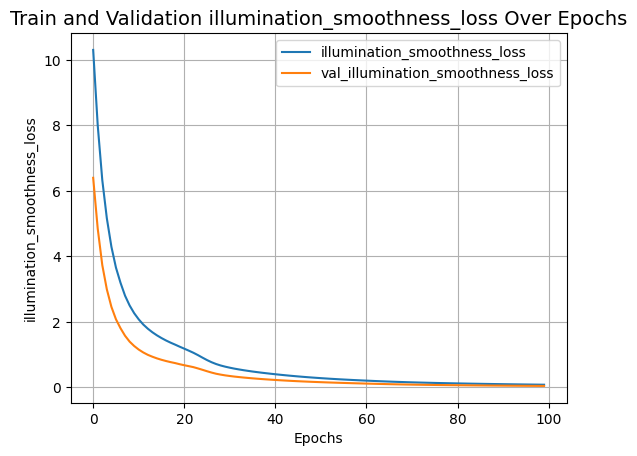

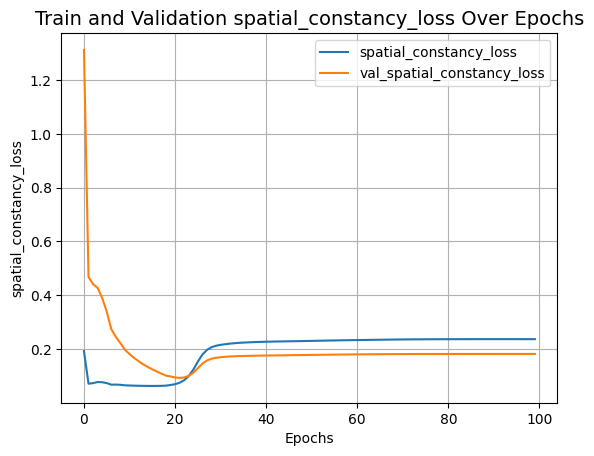

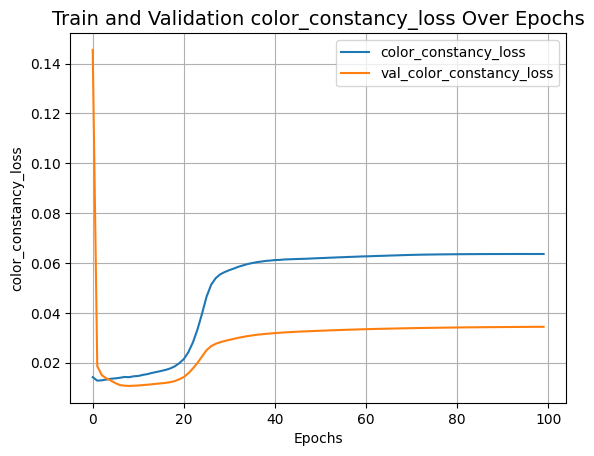

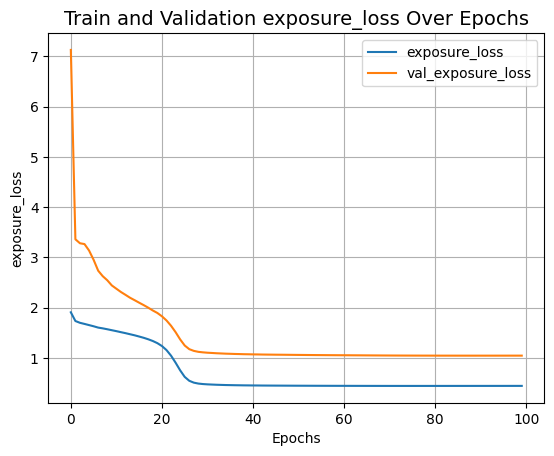

In [ ]:
# @title Attention zero dce Training
attension_zero_dce_model = AZDCE()
attension_zero_dce_model.compile(learning_rate=1e-4)
history = attension_zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=100)
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

# Plot the training history
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")


Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_9 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 separable_conv2d_7 (Separa  (None, None, None, 32)       155       ['input_9[0][0]']             
 bleConv2D)                                                                                       
                                                                                                  
 separable_conv2d_8 (Separa  (None, None, None, 32)       1344      ['separable_conv2d_7[0][0]']  
 bleConv2D)                                                                                       
                                                                                            

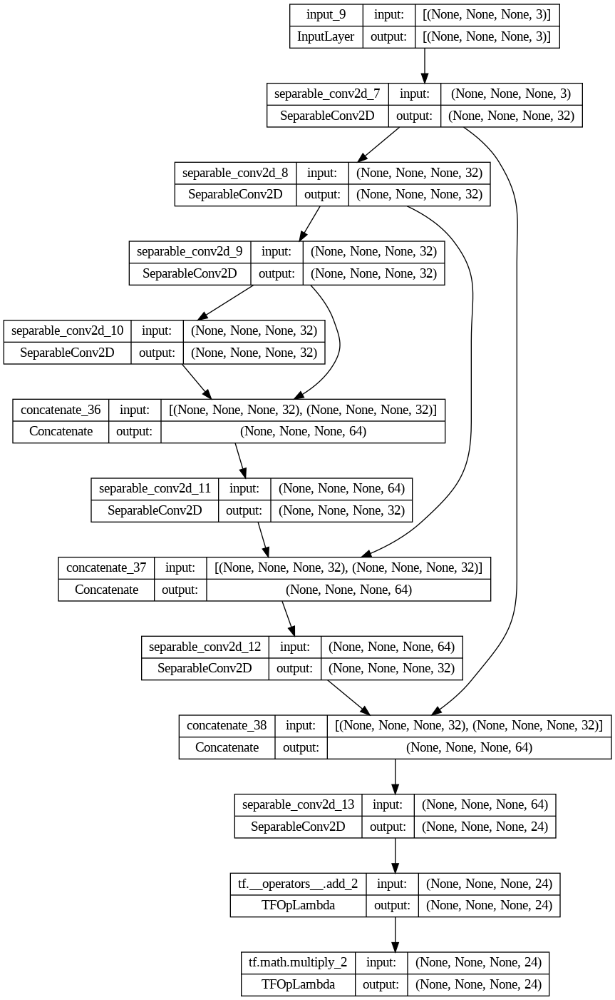

In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

def build_aszdce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(input_img)
    conv2 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv1)
    conv3 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv2)
    conv4 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.SeparableConv2D(32, (3, 3), strides=(1, 1), activation="relu", padding="same")(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.SeparableConv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(int_con3)
    x_r = (x_r + 2) * 1.5  # Scaling the output between 1 and 3 as per the AZDCE paper
    return keras.Model(inputs=input_img, outputs=x_r)

class ASZDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.azdce_model = build_aszdce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        y1 = r1 * (data**3 - 3 * data**2 + (4 - r1) * data)
        y2 = r2 * (y1**3 - 3 * y1**2 + (4 - r2) * y1)
        enhanced_image = y2
        return enhanced_image

    def call(self, data):
        azdce_net_output = self.azdce_model(data)
        return self.get_enhanced_image(data, azdce_net_output)

    # Compute losses (same as Zero-DCE)
    # ...
    def compute_losses(self, data, output):
      enhanced_image = self.get_enhanced_image(data, output)
      loss_illumination = 200 * illumination_smoothness_loss(output)
      loss_spatial_constancy = tf.reduce_mean(
          self.spatial_constancy_loss(enhanced_image, data)
      )
      loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
      loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
      total_loss = (
          loss_illumination
          + loss_spatial_constancy
          + loss_color_constancy
          + loss_exposure
      )
      return {
          "total_loss": total_loss,
          "illumination_smoothness_loss": loss_illumination,
          "spatial_constancy_loss": loss_spatial_constancy,
          "color_constancy_loss": loss_color_constancy,
          "exposure_loss": loss_exposure,
      }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.azdce_model(data)
            losses = self.compute_losses(data, output)
            gradients = tape.gradient(losses["total_loss"], self.azdce_model.trainable_weights)
            self.optimizer.apply_gradients(zip(gradients, self.azdce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.azdce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the AZDCE-Net"""
        self.azdce_model.save_weights(filepath, overwrite=overwrite, save_format=save_format, options=options)

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the AZDCE-Net"""
        self.azdce_model.load_weights(filepath=filepath, by_name=by_name, skip_mismatch=skip_mismatch, options=options)

# @title Printing parameters and block diagram of network
attention_seperable_zero_dce_model = build_aszdce_net()
attention_seperable_zero_dce_model.summary()
tf.keras.utils.plot_model(attention_seperable_zero_dce_model, show_shapes=True)

Epoch 1/100
25/25 [==============================] - 12s 304ms/step - total_loss: 14.5412 - illumination_smoothness_loss: 0.1377 - spatial_constancy_loss: 2.6710 - color_constancy_loss: 0.1304 - exposure_loss: 11.6020 - val_total_loss: 140.0574 - val_illumination_smoothness_loss: 0.1249 - val_spatial_constancy_loss: 27.9508 - val_color_constancy_loss: 0.0464 - val_exposure_loss: 111.9353
Epoch 2/100
25/25 [==============================] - 8s 303ms/step - total_loss: 13.8050 - illumination_smoothness_loss: 0.1339 - spatial_constancy_loss: 2.5150 - color_constancy_loss: 0.1236 - exposure_loss: 11.0325 - val_total_loss: 131.9570 - val_illumination_smoothness_loss: 0.1228 - val_spatial_constancy_loss: 26.2903 - val_color_constancy_loss: 0.0435 - val_exposure_loss: 105.5004
Epoch 3/100
25/25 [==============================] - 8s 299ms/step - total_loss: 13.1707 - illumination_smoothness_loss: 0.1319 - spatial_constancy_loss: 2.3830 - color_constancy_loss: 0.1176 - exposure_loss: 10.5382 - 

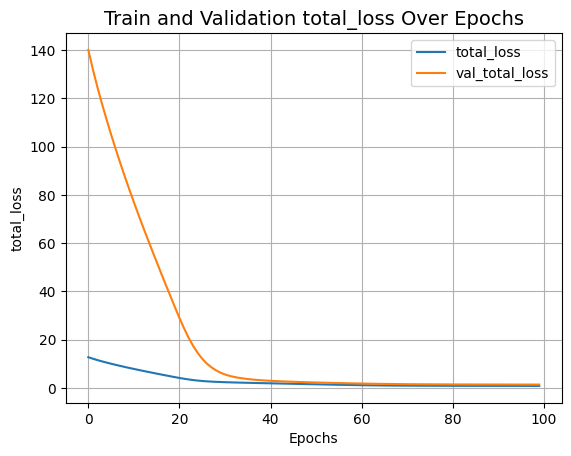

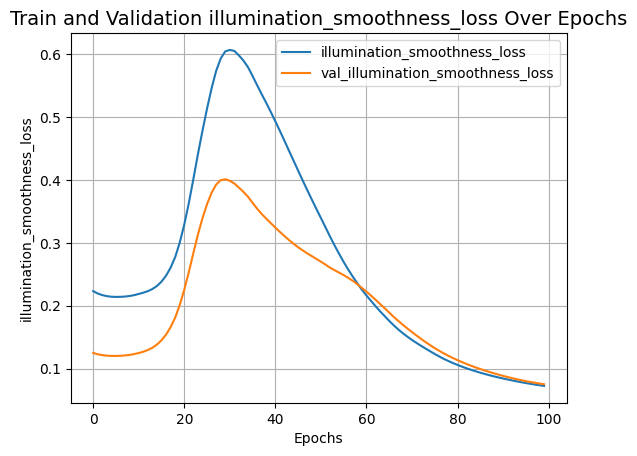

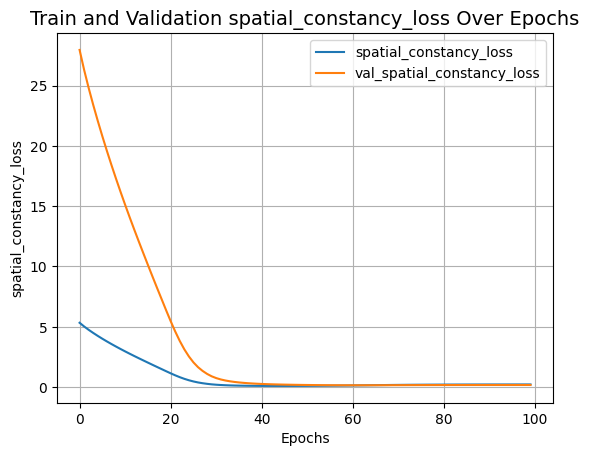

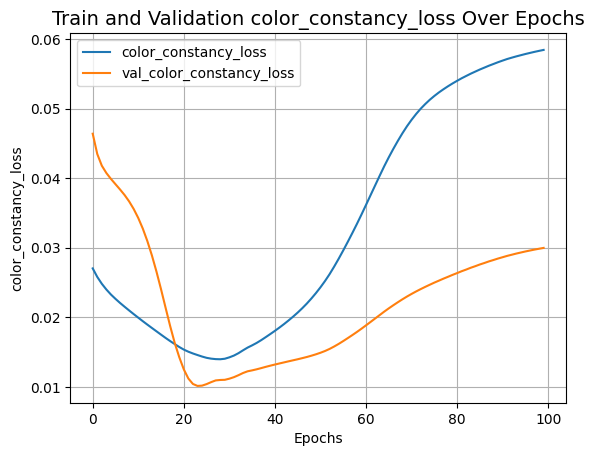

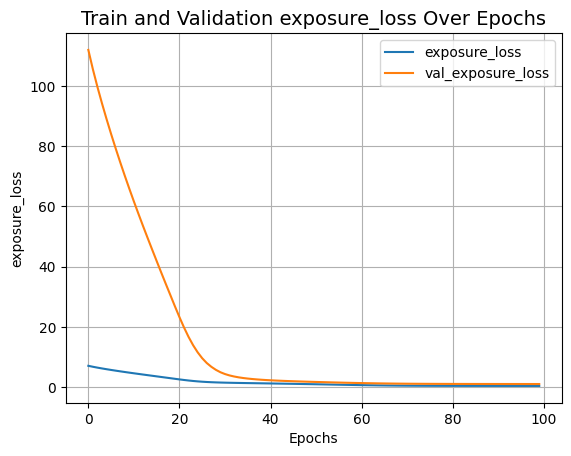

TypeError: cannot pickle 'weakref.ReferenceType' object

In [ ]:
import pickle

# Train your model and obtain the history object
attention_seperable_zero_dce_model = ASZDCE()
attention_seperable_zero_dce_model.compile(learning_rate=1e-4)
history = attention_seperable_zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=100)

# Define a function to plot the training history
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

# Plot the training history
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")


Model: "model_10"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, None, None, 3)]      0         []                            
                                                                                                  
 tf.split_12 (TFOpLambda)    [(None, None, None, 1),      0         ['input_11[0][0]']            
                              (None, None, None, 1),                                              
                              (None, None, None, 1)]                                              
                                                                                                  
 conv2d_73 (Conv2D)          (None, None, None, 10)       20        ['tf.split_12[0][0]']         
                                                                                           

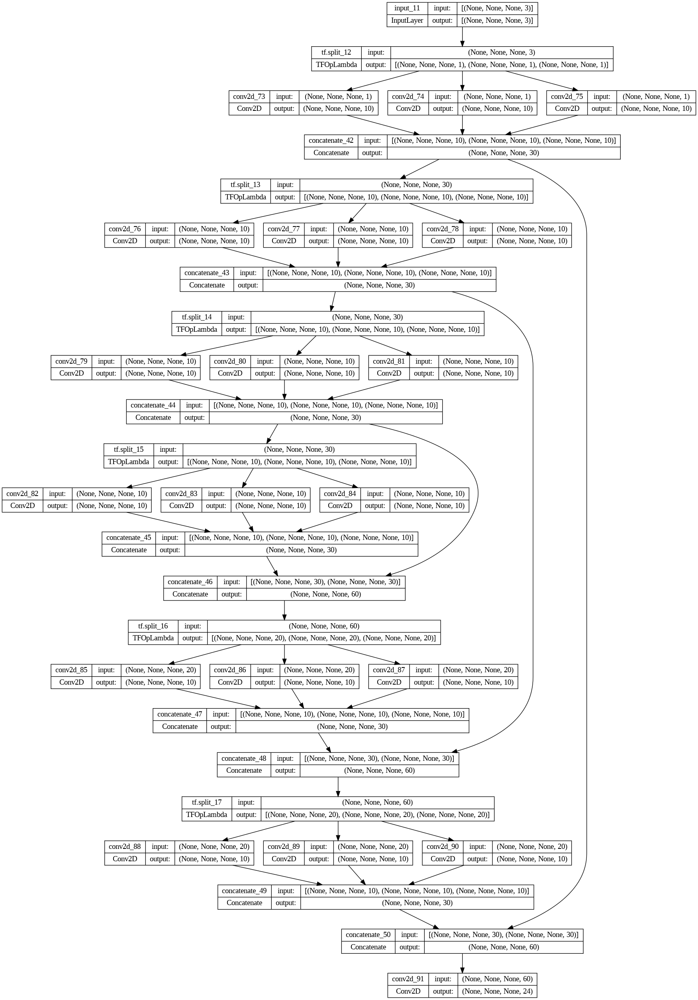

In [ ]:
# @title Grouped attention zero dce
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

def grouped_convolution(x, filters, kernel_size, groups, strides=(1, 1), padding='same', activation='relu'):
    # Split input and apply Conv2D separately to each group
    input_groups = tf.split(x, groups, axis=-1)
    output_groups = [layers.Conv2D(filters // groups, kernel_size, strides=strides, padding=padding, activation=activation)(group) for group in input_groups]
    # Concatenate the results
    x = layers.concatenate(output_groups, axis=-1)
    return x

def build_grouped_azdce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = grouped_convolution(input_img, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv2 = grouped_convolution(conv1, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv3 = grouped_convolution(conv2, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")
    conv4 = grouped_convolution(conv3, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])

    conv5 = grouped_convolution(int_con1, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])

    conv6 = grouped_convolution(int_con2, filters=32, kernel_size=(1, 1), groups=3, activation="relu", padding="same")

    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])

    x_r = layers.Conv2D(24, (3, 3), activation="tanh", padding="same")(int_con3)

    return keras.Model(inputs=input_img, outputs=x_r)

class GAZDCE(keras.Model):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.gazdce_model = build_grouped_azdce_net()

    def compile(self, learning_rate, **kwargs):
        super().compile(**kwargs)
        self.optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def get_enhanced_image(self, data, output):
        r1 = output[:, :, :, :3]
        r2 = output[:, :, :, 3:6]
        y1 = r1 * (data**3 - 3 * data**2 + (4 - r1) * data)
        y2 = r2 * (y1**3 - 3 * y1**2 + (4 - r2) * y1)
        enhanced_image = y2
        return enhanced_image

    def call(self, data):
        azdce_net_output = self.gazdce_model(data)
        return self.get_enhanced_image(data, azdce_net_output)

    # Compute losses (same as Zero-DCE)
    # ...
    def compute_losses(self, data, output):
      enhanced_image = self.get_enhanced_image(data, output)
      loss_illumination = 200 * illumination_smoothness_loss(output)
      loss_spatial_constancy = tf.reduce_mean(
          self.spatial_constancy_loss(enhanced_image, data)
      )
      loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
      loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
      total_loss = (
          loss_illumination
          + loss_spatial_constancy
          + loss_color_constancy
          + loss_exposure
      )
      return {
          "total_loss": total_loss,
          "illumination_smoothness_loss": loss_illumination,
          "spatial_constancy_loss": loss_spatial_constancy,
          "color_constancy_loss": loss_color_constancy,
          "exposure_loss": loss_exposure,
      }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.gazdce_model(data)
            losses = self.compute_losses(data, output)
            gradients = tape.gradient(losses["total_loss"], self.gazdce_model.trainable_weights)
            self.optimizer.apply_gradients(zip(gradients, self.gazdce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.gazdce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        """While saving the weights, we simply save the weights of the AZDCE-Net"""
        self.gazdce_model.save_weights(filepath, overwrite=overwrite, save_format=save_format, options=options)

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        """While loading the weights, we simply load the weights of the AZDCE-Net"""
        self.gazdce_model.load_weights(filepath=filepath, by_name=by_name, skip_mismatch=skip_mismatch, options=options)

# @title Printing parameters and block diagram of network
grouped_attension_zero_dce_model = build_grouped_azdce_net()
grouped_attension_zero_dce_model.summary()
tf.keras.utils.plot_model(grouped_attension_zero_dce_model, show_shapes=True)



Epoch 1/100
25/25 [==============================] - 13s 235ms/step - total_loss: 5.3296 - illumination_smoothness_loss: 1.7136 - spatial_constancy_loss: 0.0113 - color_constancy_loss: 2.3789e-04 - exposure_loss: 3.6045 - val_total_loss: 5.0203 - val_illumination_smoothness_loss: 1.4056 - val_spatial_constancy_loss: 0.0111 - val_color_constancy_loss: 4.1969e-05 - val_exposure_loss: 3.6035
Epoch 2/100
25/25 [==============================] - 6s 219ms/step - total_loss: 4.8052 - illumination_smoothness_loss: 1.1914 - spatial_constancy_loss: 0.0112 - color_constancy_loss: 8.1241e-05 - exposure_loss: 3.6026 - val_total_loss: 4.6026 - val_illumination_smoothness_loss: 0.9894 - val_spatial_constancy_loss: 0.0110 - val_color_constancy_loss: 1.6081e-05 - val_exposure_loss: 3.6021
Epoch 3/100
25/25 [==============================] - 6s 218ms/step - total_loss: 4.4974 - illumination_smoothness_loss: 0.8850 - spatial_constancy_loss: 0.0111 - color_constancy_loss: 2.9059e-05 - exposure_loss: 3.601

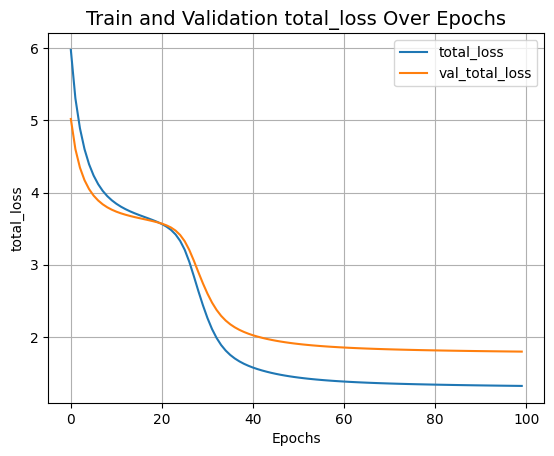

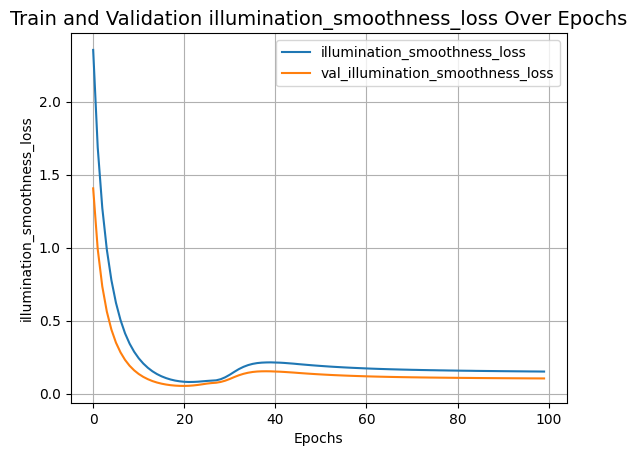

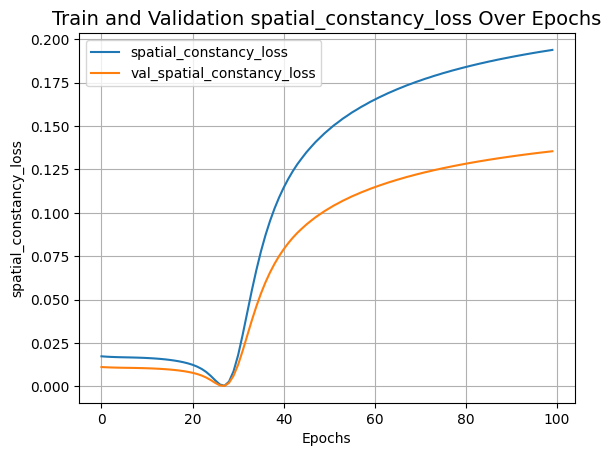

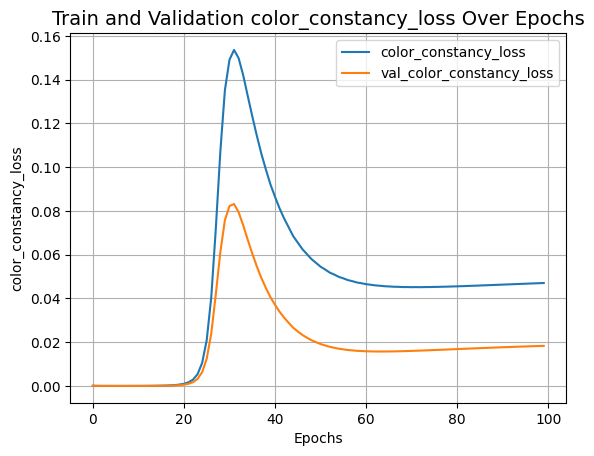

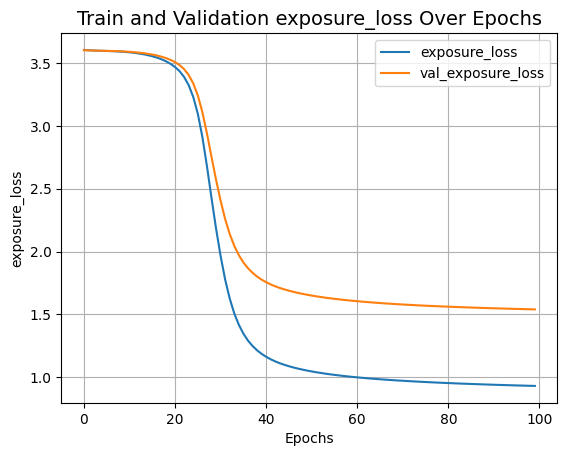

In [ ]:
# @title Training
grouped_attension_zero_dce_model = GAZDCE()
grouped_attension_zero_dce_model.compile(learning_rate=1e-4)
history = grouped_attension_zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=100)
def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

# Plot the training history
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")


In [ ]:
# @title Inferance
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()

# Define the function for inference and plot the results
def zdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

def szdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dceplusplus_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

def gzdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = groupedZeroDCE_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

def azdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = attension_zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

def aszdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = attention_seperable_zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

def agzdceinfer(original_image):
    image = keras.utils.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = grouped_attension_zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

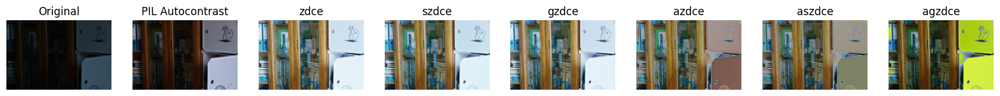

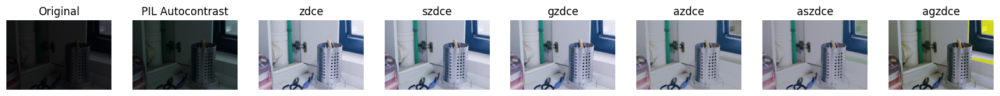

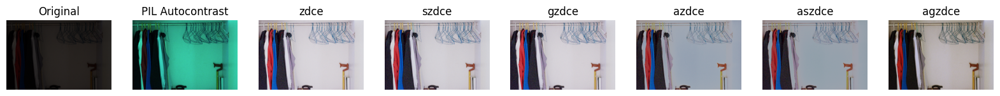

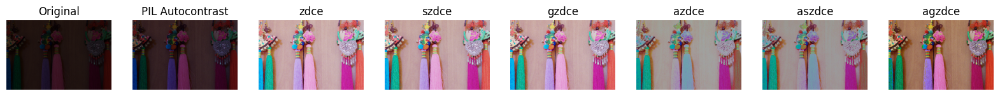

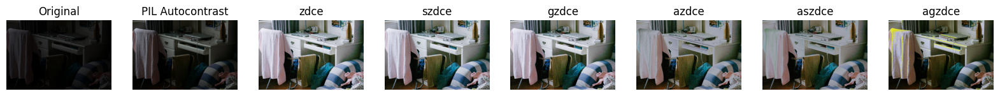

...

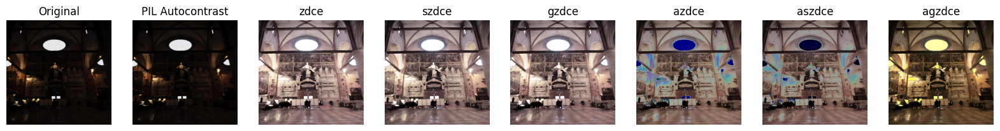

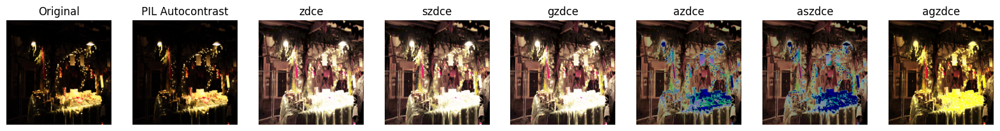

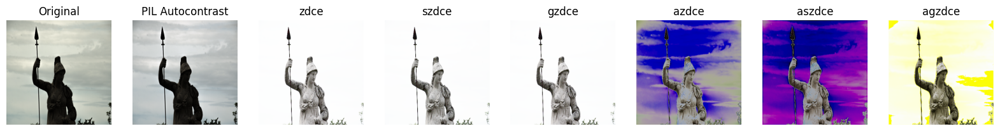

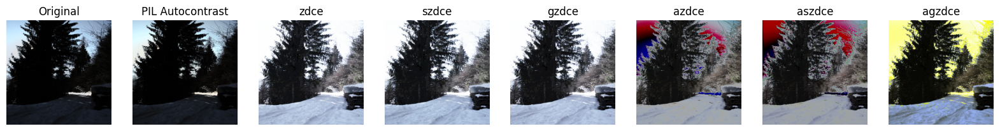

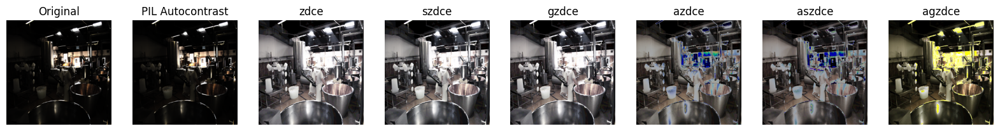

Image: /content/lol_dataset/eval15/low/1.png
Model: zdce
The SSIM: 0.20
The PSNR: 11.64 dB
The RMSE: 0.51

Model: szdce
The SSIM: 0.21
The PSNR: 12.18 dB
The RMSE: 0.50

Model: gzdce
The SSIM: 0.20
The PSNR: 11.88 dB
The RMSE: 0.50

Model: azdce
The SSIM: 0.25
The PSNR: 18.02 dB
The RMSE: 0.35

Model: aszdce
The SSIM: 0.26
The PSNR: 18.45 dB
The RMSE: 0.35

Model: agzdce
The SSIM: 0.29
The PSNR: 18.15 dB
The RMSE: 0.35

Image: /content/lol_dataset/eval15/low/111.png
Model: zdce
The SSIM: 0.18
The PSNR: 9.60 dB
The RMSE: 0.58

Model: szdce
The SSIM: 0.19
The PSNR: 10.24 dB
The RMSE: 0.55

Model: gzdce
The SSIM: 0.19
The PSNR: 9.89 dB
The RMSE: 0.57

Model: azdce
The SSIM: 0.21
The PSNR: 12.49 dB
The RMSE: 0.49

Model: aszdce
The SSIM: 0.22
The PSNR: 13.22 dB
The RMSE: 0.47

Model: agzdce
The SSIM: 0.25
The PSNR: 16.36 dB
The RMSE: 0.39

Image: /content/lol_dataset/eval15/low/146.png
Model: zdce
The SSIM: 0.22
The PSNR: 8.75 dB
The RMSE: 0.60

Model: szdce
The SSIM: 0.22
The PSNR: 9.29 d

In [ ]:
import cv2
import glob
import numpy as np
from PIL import Image, ImageOps
from skimage.metrics import structural_similarity as compare_ssim
import matplotlib.pyplot as plt

test_low_light_images = sorted(glob.glob("/content/lol_dataset/eval15/low/*"))
psnr_dict = {}
ssim_dict = {}
rmse_dict = {}

for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    zdce_image = zdceinfer(original_image)
    szdce_image = szdceinfer(original_image)
    gzdce_image = gzdceinfer(original_image)
    azdce_image = azdceinfer(original_image)
    aszdce_image = aszdceinfer(original_image)
    agzdce_image = agzdceinfer(original_image)

    # convert images to numpy arrays and float32 for accurate calculations
    original_image_np = np.array(original_image).astype(np.float32) / 255.0

    # Initialize dictionaries for storing metrics
    psnr_dict[val_image_file] = {}
    ssim_dict[val_image_file] = {}
    rmse_dict[val_image_file] = {}

    # Calculate SSIM, PSNR, and RMSE for zdce_image
    zdce_image_np = np.array(zdce_image).astype(np.float32) / 255.0
    ssim_r = compare_ssim(original_image_np[..., 0], zdce_image_np[..., 0])
    ssim_g = compare_ssim(original_image_np[..., 1], zdce_image_np[..., 1])
    ssim_b = compare_ssim(original_image_np[..., 2], zdce_image_np[..., 2])
    ssim = (ssim_r + ssim_g + ssim_b) / 3
    ssim_dict[val_image_file]['zdce'] = ssim

    mse_r = np.mean((original_image_np[..., 0] - zdce_image_np[..., 0]) ** 2)
    mse_g = np.mean((original_image_np[..., 1] - zdce_image_np[..., 1]) ** 2)
    mse_b = np.mean((original_image_np[..., 2] - zdce_image_np[..., 2]) ** 2)
    mse = (mse_r + mse_g + mse_b) / 3
    max_pixel_value = 1.0
    psnr = 20 * np.log10((max_pixel_value ** 2) / (mse))
    psnr_dict[val_image_file]['zdce'] = psnr
    rmse = np.sqrt(np.mean((original_image_np - zdce_image_np) ** 2))
    rmse_dict[val_image_file]['zdce'] = rmse

    # Plot the original and enhanced images for zdce
    plt.figure(figsize=(20, 12))
    plt.subplot(1, 8, 1).set_title("Original")
    plt.imshow(original_image)
    plt.axis('off')
    plt.subplot(1, 8, 2).set_title("PIL Autocontrast")
    plt.imshow(ImageOps.autocontrast(original_image))
    plt.axis('off')
    plt.subplot(1, 8, 3).set_title("zdce")
    plt.imshow(zdce_image)
    plt.axis('off')

    # Calculate and plot SSIM, PSNR, and RMSE for szdce, gzdce, azdce, aszdce, and agzdce
    for model_name, enhanced_image in zip(['szdce', 'gzdce', 'azdce', 'aszdce', 'agzdce'], [szdce_image, gzdce_image, azdce_image, aszdce_image, agzdce_image]):
        enhanced_image_np = np.array(enhanced_image).astype(np.float32) / 255.0

        # Calculate SSIM
        ssim_r = compare_ssim(original_image_np[..., 0], enhanced_image_np[..., 0])
        ssim_g = compare_ssim(original_image_np[..., 1], enhanced_image_np[..., 1])
        ssim_b = compare_ssim(original_image_np[..., 2], enhanced_image_np[..., 2])
        ssim = (ssim_r + ssim_g + ssim_b) / 3
        ssim_dict[val_image_file][model_name] = ssim

        # Calculate MSE and PSNR
        mse_r = np.mean((original_image_np[..., 0] - enhanced_image_np[..., 0]) ** 2)
        mse_g = np.mean((original_image_np[..., 1] - enhanced_image_np[..., 1]) ** 2)
        mse_b = np.mean((original_image_np[..., 2] - enhanced_image_np[..., 2]) ** 2)
        mse = (mse_r + mse_g + mse_b) / 3
        psnr = 20 * np.log10((max_pixel_value ** 2) / (mse))
        psnr_dict[val_image_file][model_name] = psnr

        # Calculate RMSE
        rmse = np.sqrt(np.mean((original_image_np - enhanced_image_np) ** 2))
        rmse_dict[val_image_file][model_name] = rmse

        # Plot the enhanced images
        plt.subplot(1, 8, 4 + ['szdce', 'gzdce', 'azdce', 'aszdce', 'agzdce'].index(model_name)).set_title(model_name)
        plt.imshow(enhanced_image)
        plt.axis('off')
    plt.show()

# Print metrics
for val_image_file in test_low_light_images:
    print(f"Image: {val_image_file}")
    for model_name in ['zdce', 'szdce', 'gzdce', 'azdce', 'aszdce', 'agzdce']:
        print(f"Model: {model_name}")
        print(f"The SSIM: {ssim_dict[val_image_file][model_name]:.2f}")
        print(f"The PSNR: {psnr_dict[val_image_file][model_name]:.2f} dB")
        print(f"The RMSE: {rmse_dict[val_image_file][model_name]:.2f}")
        print()

# Calculate average metrics
average_psnr = np.mean([psnr for file_metrics in psnr_dict.values() for psnr in file_metrics.values()])
average_ssim = np.mean([ssim for file_metrics in ssim_dict.values() for ssim in file_metrics.values()])
average_rmse = np.mean([rmse for file_metrics in rmse_dict.values() for rmse in file_metrics.values()])

print(f"Average PSNR: {average_psnr:.2f} dB")
print(f"Average SSIM: {average_ssim:.2f}")
print(f"Average RMSE: {average_rmse:.2f}")